In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime
import random
from statsmodels.stats.power import tt_ind_solve_power
from statsmodels.tsa.seasonal import seasonal_decompose

def date_converter(x):
    return datetime.datetime.strptime(x,'%Y-%m-%d')

Срок выполнения задания: 13 апреля 17:00.


### Задание
Вам предстоит разработать дизайн эксперимента по тестированию монетизационных продуктов.
В конечном счёте, в монтизационных продуктах нас всегда интересует увеличение выручки, 
но к сожалению не всегда мы можем зафиксировать изменение именно этой метрики.

#### Кейс
Вы аналитик в продуктовой дискавери команде.
На текущий момент приближается начало нового квартала и вам необходимо спланировать
эксперименты в нём.

У вас есть два продукта:
- один базовый продукт, который предоставляет минимальный набор услуг на вашем ресурсе;
- один продвинутый продукт, который предоставляет расширенный набор услуг.

На текущий момент на квартал у вашей команды есть для проверки две гипотезы:
- Дополнительное информирование об эффективности услуг будет стимулировать их покупку;
- Повышение цены базового продукта должно стимулировать покупку продвинутого продукта


#### Для планирования эксперимента изучите данные и метрики (2 балла):

- Загрузите файл и изучите данные;
- Подумайте над тем, какие метрики можно выделить на основе этих данных: выручка, пользователи, транзакции, средний чек и т.д.
- Постройте графики плотности распределения для этих метрик и сделайте выводы о характере распределений: тип, наличие выбросов, насколько сильный разброс;
- Изучите основные статистики этих метрик: среднее, стандартное отклонение;
- Изучите то, насколько эти статистики подвержены сезональности.


#### Формализуйте гипотезы (4 балла):

- Опишите метрики и статистики, изменение которых вы ожидаете;
- Предположите какое относительное изменение этих статистик в процентах вы ожидаете.

#### Предскажите минимально детектируемый эффект для своих метрик и спланируйте эксперименты внутри квартала (4 балла):

- Принимая в расчёт максимально возможные размеры групп и ограничения по длительности в квартал рассмотрите разные планы проведения тестов и предскажите их чувствительность;
- Определите наиболее оптимальный план экспериментов. Обоснуйте, почему вы его считаете оптимальным.


#### * Оптимизация плана (2 балла):
Предложите варианты ускорения экспериментов — всегда могут образоваться ситуации, когда ваши гипотезы не подтвердились и они требуют изменения или уточнения и необходимости повторных тестов. Цели достигать всегда хорошо в рамках отведённого на них срока. Какие параметры экспериментов вы поменяете? К каким последствиям могут привести такие изменения?

#### Описание данныx

event_date - дата 

user_id - идентификатор пользователя

product - тип продукта

amount - сумма покупок

transactions - количество транзакций


In [4]:
df = pd.read_csv('user_transactions.csv')
df['event_date']=df.event_date.apply(date_converter)

In [28]:
df = df.dropna()

Начну с описательных статистик. 

In [6]:
df.describe()

,user_id,amount,transactions
count,2.318620e+05,231861.000000,231861.000000
mean,4.566917e+18,233.113913,1.275454
std,2.661136e+18,397.282818,2.010160
min,1.912220e+12,8.000000,1.000000
25%,2.255358e+18,89.000000,1.000000
50%,4.546977e+18,149.000000,1.000000
75%,6.861903e+18,250.000000,1.000000
max,9.223333e+18,108186.000000,768.000000


Получается, нашим продуктом пользуется 446 935 уникальных пользователей

In [7]:
len(df.user_id.unique())

128720

Посмотрим, как распределены они в зависимости от типа подписки: basic или advanced 

In [8]:
df['product'].value_counts(normalize = True)

basic       0.775421
advanced    0.224579
Name: product, dtype: float64

Более 75% подписок на наш продукт - категории basic.

Посмотрим также на выручку и количество транзакций: какую долю занимает basic или advanced продукты в каждом случае.

Выручка всего

In [9]:
df.amount.sum()

54050025.0

Выручка по типу продукта

In [10]:
df_wrk = df.groupby(["product"])[["amount"]].agg("sum")
df_wrk/df_wrk.amount.sum()

,amount
product,
advanced,0.455737
basic,0.544263


Транзакций всего

In [11]:
df.transactions.sum()

295728.0

Транзакций по типу продукта

In [12]:
df_wrk = df.groupby(["product"])[["transactions"]].agg("count")
df_wrk/df_wrk.transactions.sum()

,transactions
product,
advanced,0.224579
basic,0.775421


Построю графики и изучу основные статистики по выручке и количеству транзакций

In [29]:
df

,event_date,user_id,product,amount,transactions
0,2020-09-29,40746820883461494,basic,95.0,1.0
1,2020-09-29,41102328408008828,advanced,279.0,1.0
2,2020-09-29,63464894315144075,basic,64.0,1.0
3,2020-09-29,111526991873455341,basic,399.0,1.0
4,2020-09-29,169522572963414231,basic,199.0,1.0
...,...,...,...,...,...
231856,2020-11-06,5991781560309392205,basic,190.0,1.0
231857,2020-11-06,5995036006301315108,basic,320.0,2.0
231858,2020-11-06,6026010963755256280,advanced,349.0,1.0
231859,2020-11-06,6046539758244390105,basic,97.0,1.0


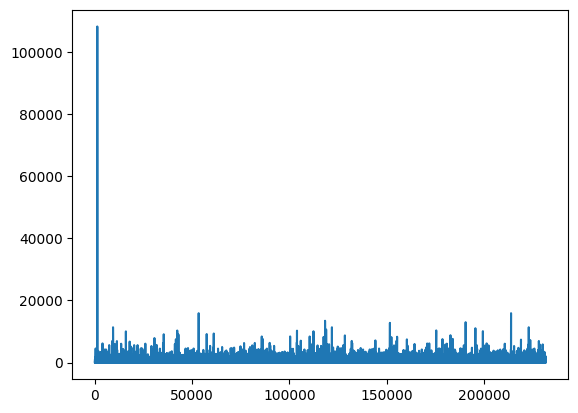

In [14]:
ax = df['amount'].plot()

Видно что есть выбросы, при этом средний чек совсем не такой большой

<Axes: >

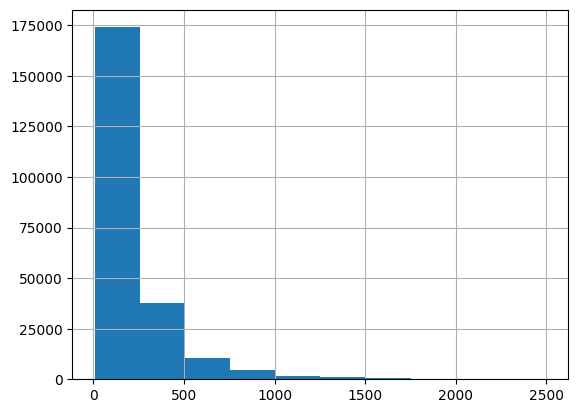

In [35]:
df.query('amount < 2500')['amount'].hist()

Аналогично с количеством транзакций

<Axes: >

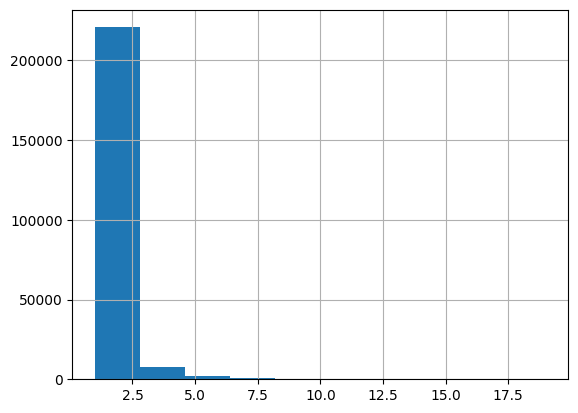

In [39]:
df.query('transactions < 20')['transactions'].hist()

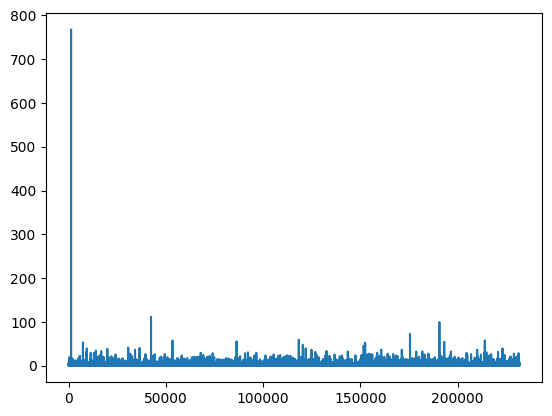

In [15]:
ax = df['transactions'].plot()

In [17]:
import plotly.express as px
fig = px.histogram(df, x="event_date", y="amount")
fig.show()

In [21]:
fig = px.histogram(df, x="event_date", y="transactions")
fig.show()

Посмотрим на средний чек, среднее количество транзакций и другие описательные статистики

In [44]:
df.groupby(["product"])[["amount", "transactions"]].agg(['max', 'min', 'sum','mean', 'std', 'median'])

amount                                                   \
               max   min         sum        mean         std median   
product                                                               
advanced   13440.0  20.0  24632586.0  473.057671  519.778186  349.0   
basic     108186.0   8.0  29417439.0  163.621108  322.174509  120.0   

         transactions                                            
                  max  min       sum      mean       std median  
product                                                          
advanced         60.0  1.0   65231.0  1.252732  1.072376    1.0  
basic           768.0  1.0  230497.0  1.282035  2.208571    1.0

Итак, видно что по подписке advanced пользователь в среднем совершает немного меньше транзакций (медиана в обоих вариантах подписки это 1 транзакция), но при этом дисперсия больше в базовой подписке. 

С подпиской advanced пользователи в среднем имеют чек больше, чем по базовой подписке, медиана среди пользователей с advanced подпиской тоже больше (349 против 120 на базовом тарифе), но и стандартное отклонение у них больше.

- Дополнительное информирование об эффективности услуг будет стимулировать их покупку;
- Повышение цены базового продукта должно стимулировать покупку продвинутого продукта

По первой гипотезе: я бы смотрела в первую очередь на увеличение количества транзакций в целом, в каждой категории подписки - как следствие следует обратить внимание и на увеличение выручки, но целевая метрика это все транзакции в приложении. 

Судя по графику совокупных транзакций в приложении, их количество со временем снижается, а с 29 на 30 октября по какой-то причине упало более чем в два раза. Поэтому я думаю, что повышение информирования может увеличить количество транзакций в сутки хотя бы на 25 процентов.


По второй гипотезе: я бы ориентировалась на увеличение пользователей с подпиской advanced и приблизительно пропорциональное уменьшение пользоватеоей с базовой подпиской. Контр-метрика здесь это отток пользователей по базовой подписке, для которых новая цена оказалась слишком большой и они просто перестали продлевать подписку (то есть совершать транзакции, имея подписку базового уровня, после увеличения цены на нее)

Сейчас только 22% пользователей имеет подписку с расширенным функционалом, поэтому я бы ожидала прирост в 2-3% (мне кажется, что пользователи с базовой подпиской скорее будут оттекать, чем перетекать, однако это для другой домашки гипотеза :) ), с тем условием, чтобы общий отток пользователей не превысил 1 процент.